# **The Style Transfer Competition**

**Goal** :  Showcasing your creativity through image style transfer.

**What is *Style Transfer* ?** 

Style transfer is the process of modifying the style of an image while still preserving its content.
Given an input image and a style image, we can compute an output image with the original content but a new style.

[[Source]](https://towardsdatascience.com/style-transfer-styling-images-with-convolutional-neural-networks-7d215b58f461)

In this notebook, we’ll *recreate* a style transfer method that is outlined in the paper, [Image Style Transfer Using Convolutional Neural Networks, by Gatys](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) in PyTorch.

# Importing the libraries

In [0]:
# import resources
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

# Loading the model

In this example, we'll use a pre-trained VGG19 Net to extract content or style features from an input in image.

In [0]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [24]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

# Load in content and style images of your choice

Below is a helper function that loads any input image.

In [0]:
def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

In [0]:
# load in content and style image
content = load_image('Style/the-persistence-of-memory-by-salvador-dali.jpg').to(device)
# Resize style to match content, makes code easier
style = load_image('Style/starry-night-by-vincent-van-gogh.jpg', shape=content.shape[-2:]).to(device)

In [0]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

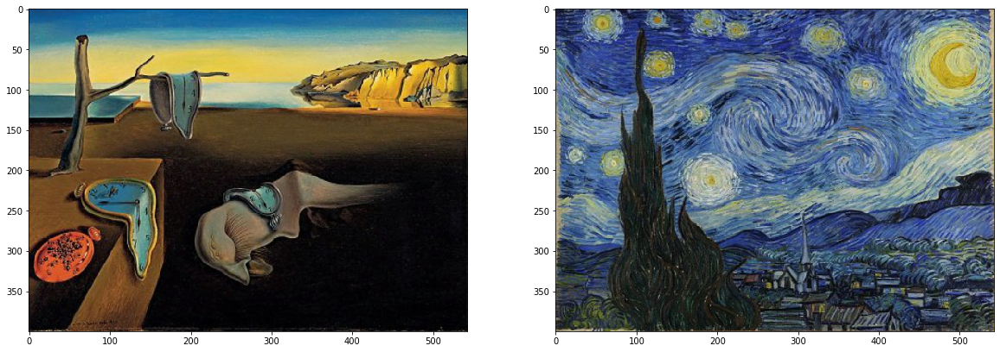

In [51]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))

# Content & Style Features

In [0]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
    
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

# Gram matrix

In [0]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

# Putting all the pieces together

In [0]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

# Loss and weights

In [0]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

# Updating the Target & Calculating Losses

Total loss:  61404.70703125


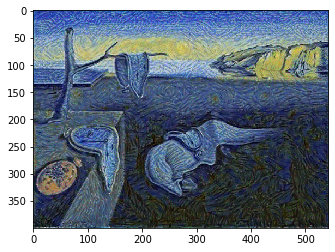

Total loss:  32990.12109375


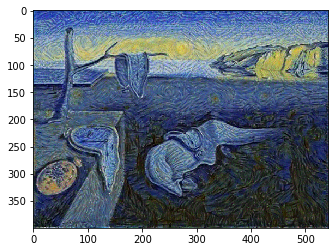

Total loss:  25010.97265625


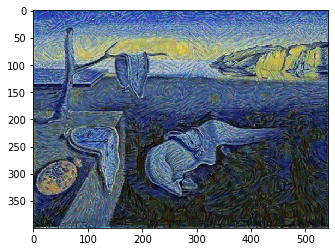

Total loss:  21600.48046875


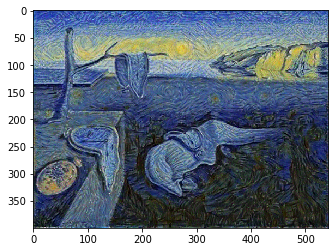

Total loss:  19663.060546875


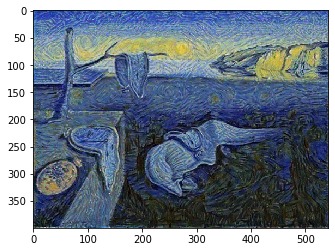

In [55]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(target, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

# Displaying the target image

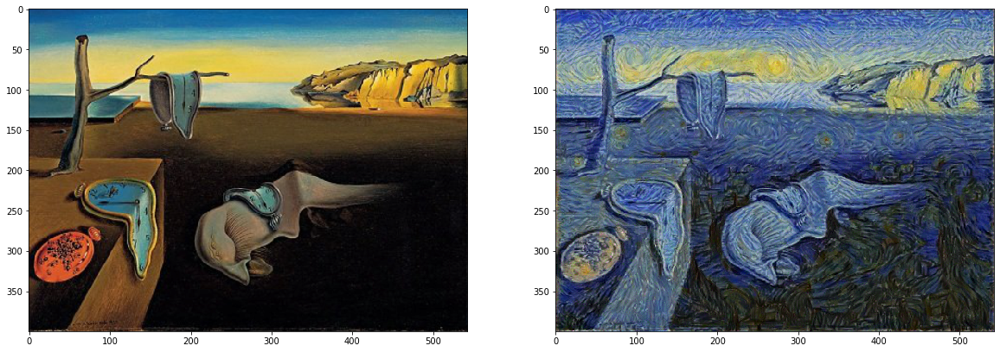

In [56]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

**Trying different images :**

In [0]:
# load in content and style image
content2 = load_image('Style/starry-night-by-vincent-van-gogh.jpg').to(device)
# Resize style to match content, makes code easier
style2 = load_image('Content/marrakech-2.jpg', shape=content.shape[-2:]).to(device)

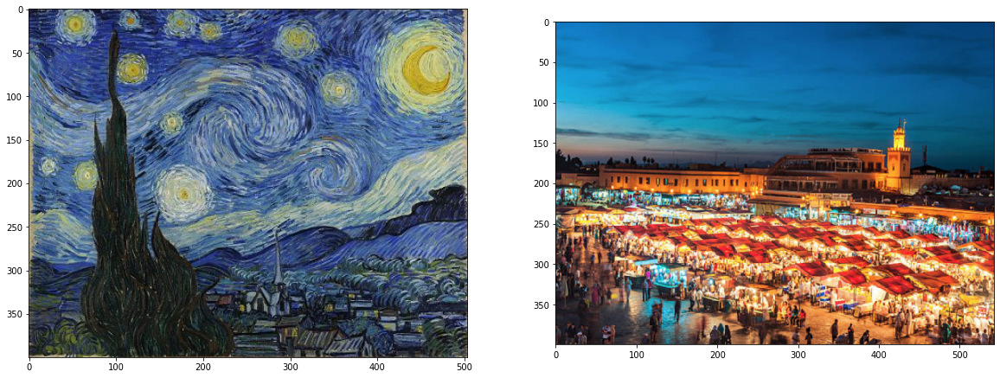

In [59]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content2))
ax2.imshow(im_convert(style2))

Total loss:  36171104.0


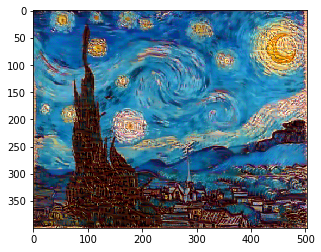

Total loss:  10954238.0


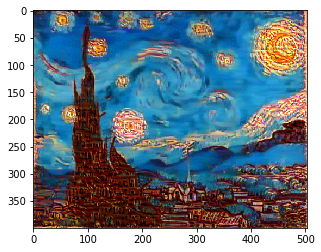

Total loss:  5050976.0


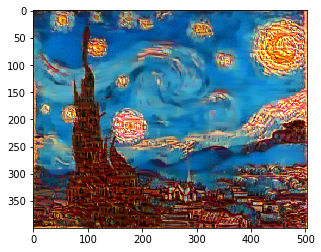

Total loss:  2858885.0


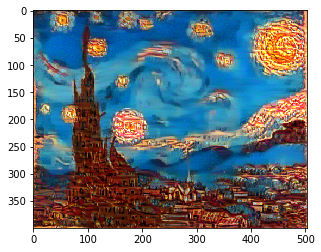

Total loss:  1876971.0


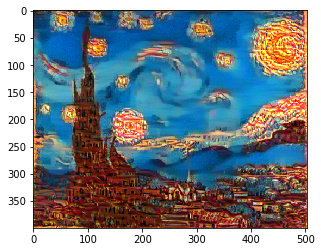

In [63]:
# get content and style features only once before training
content_features2 = get_features(content2, vgg)
style_features2 = get_features(style2, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams2 = {layer: gram_matrix(style_features2[layer]) for layer in style_features2}

# create a third "target" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
target2 = content2.clone().requires_grad_(True).to(device)

# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights2 = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight2 = 1  # alpha
style_weight2 = 1e6  # beta

# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target2], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features2 = get_features(target2, vgg)
    
    # the content loss
    content_loss2 = torch.mean((target_features2['conv4_2'] - content_features2['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss2 = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights2:
        # get the "target" style representation for the layer
        target_feature2 = target_features2[layer]
        target_gram2 = gram_matrix(target_feature2)
        _, d, h, w = target_feature2.shape
        # get the "style" style representation
        style_gram2 = style_grams2[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss2 = style_weights2[layer] * torch.mean((target_gram2 - style_gram2)**2)
        # add to the style loss
        style_loss2 += layer_style_loss2 / (d * h * w)
        
    # calculate the *total* loss
    total_loss2 = content_weight2 * content_loss2 + style_weight2 * style_loss2
    
    # update your target image
    optimizer.zero_grad()
    total_loss2.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss2.item())
        plt.imshow(im_convert(target2))
        plt.show()

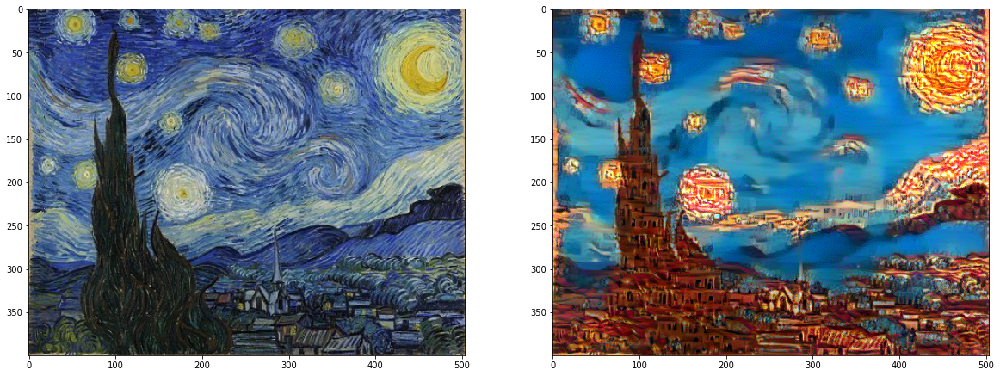

In [65]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content2))
ax2.imshow(im_convert(target2))

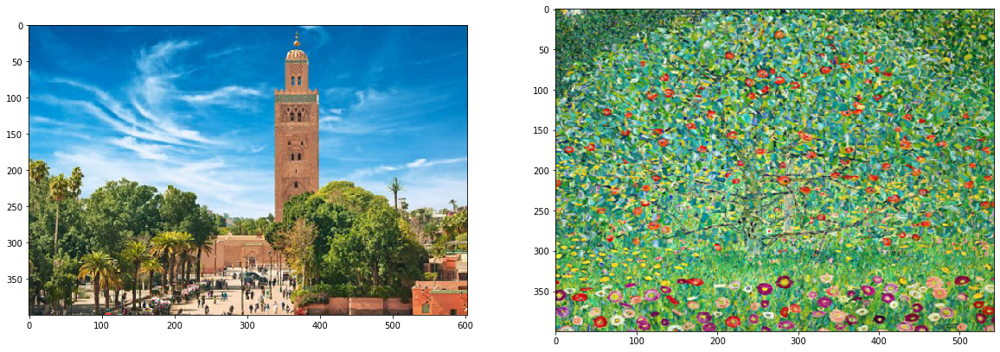

In [71]:
# load in content and style image
content3 = load_image('Content/koutoubia-mosque.jpg').to(device)
# Resize style to match content, makes code easier
style3 = load_image('Style/gustavklimt.jpg', shape=content.shape[-2:]).to(device)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content3))
ax2.imshow(im_convert(style3))

Total loss:  107738232.0


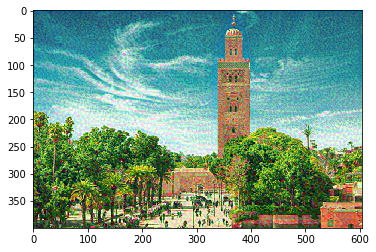

Total loss:  20307134.0


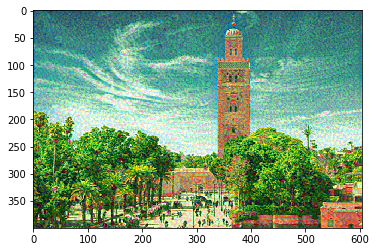

Total loss:  8344269.0


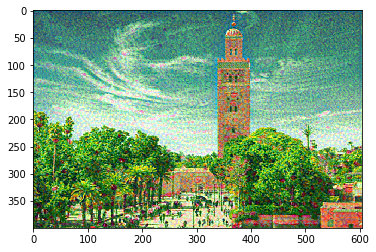

Total loss:  5039584.5


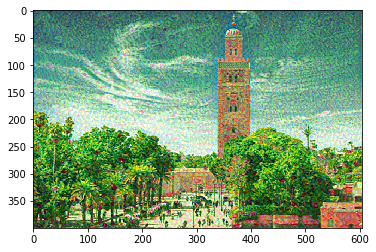

Total loss:  3498821.0


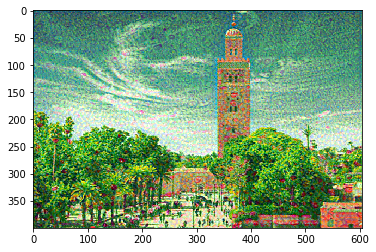

In [72]:
# get content and style features only once before training
content_features3 = get_features(content3, vgg)
style_features3 = get_features(style3, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams3 = {layer: gram_matrix(style_features3[layer]) for layer in style_features3}

# create a third "target" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
target3 = content3.clone().requires_grad_(True).to(device)

# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights3 = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight3 = 1  # alpha
style_weight3 = 1e6  # beta

# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target3], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features3 = get_features(target3, vgg)
    
    # the content loss
    content_loss3 = torch.mean((target_features3['conv4_2'] - content_features3['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss3 = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights3:
        # get the "target" style representation for the layer
        target_feature3 = target_features3[layer]
        target_gram3 = gram_matrix(target_feature3)
        _, d, h, w = target_feature3.shape
        # get the "style" style representation
        style_gram3 = style_grams3[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss3 = style_weights3[layer] * torch.mean((target_gram3 - style_gram3)**2)
        # add to the style loss
        style_loss3 += layer_style_loss3 / (d * h * w)
        
    # calculate the *total* loss
    total_loss3 = content_weight3 * content_loss3 + style_weight3 * style_loss3
    
    # update your target image
    optimizer.zero_grad()
    total_loss3.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss3.item())
        plt.imshow(im_convert(target3))
        plt.show()

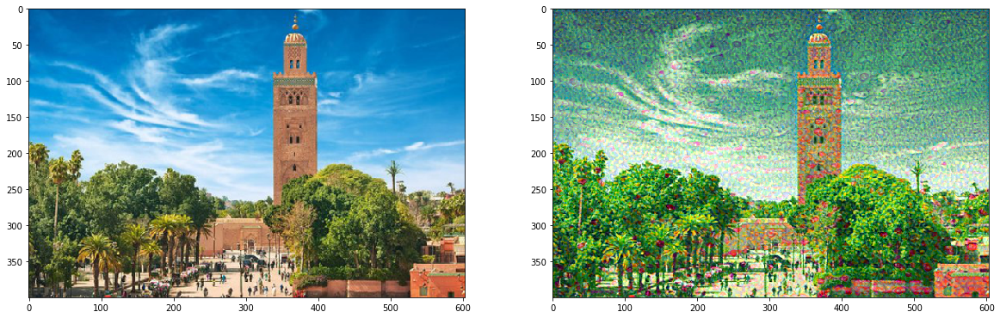

In [73]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content3))
ax2.imshow(im_convert(target3))